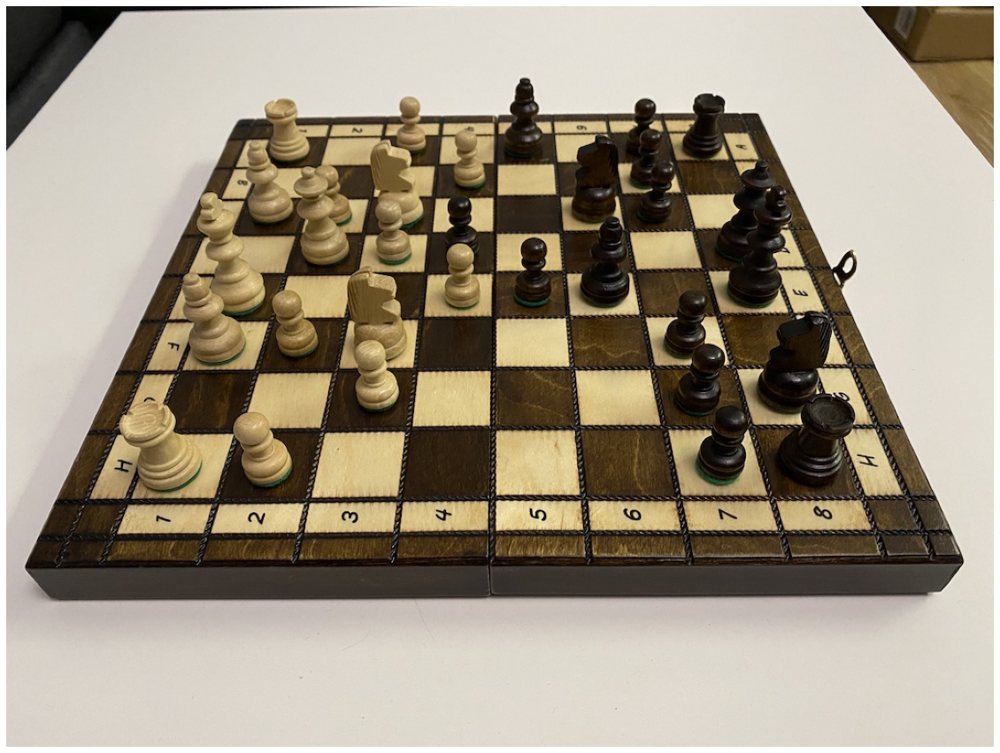

In [106]:
# @formatter:off
%reload_ext autoreload
%autoreload 2
%matplotlib inline
# @formatter:on

import cv2 as cv
import numpy as np
import math

from utils import show_image, merge_lines, draw_lines, distinct_colors, process_hough_lines, show_lines, Line, \
    lines_intersection_point
from IPython.display import display

img = cv.imread('images/chess.jpg')
show_image(img)
original_img = img.copy()

# constants

COLOR_RED = (0, 0, 255)
HORIZONTAL_THETA = np.pi / 2
CHESSBOARD_LINES_NO = 9

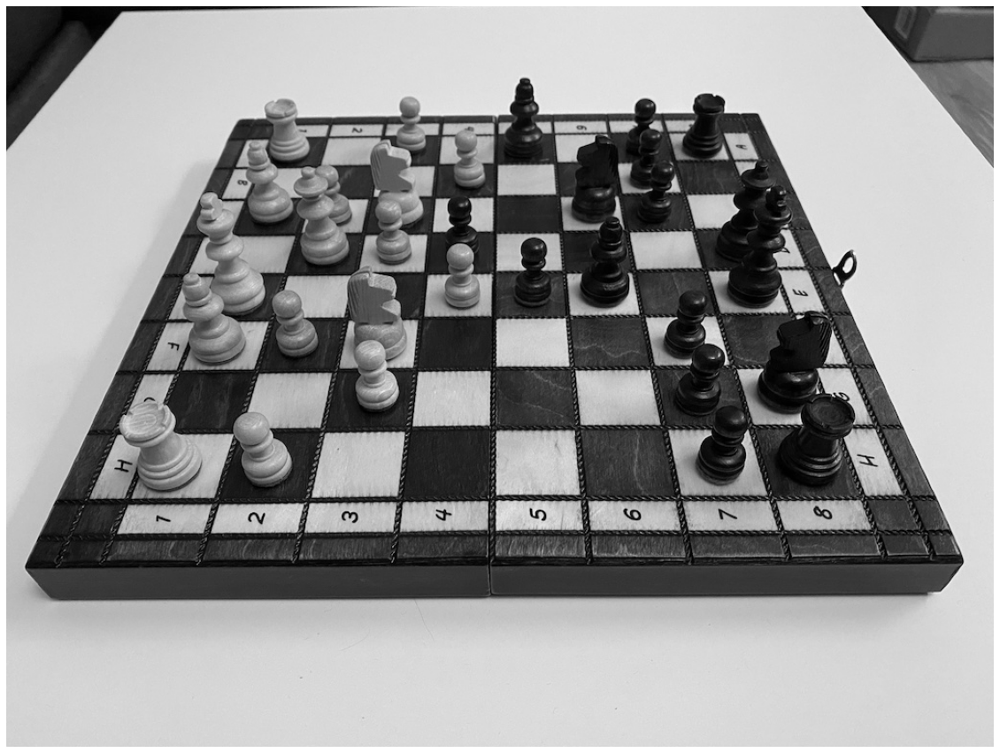

In [107]:
# grayscale image

img = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
show_image(img)

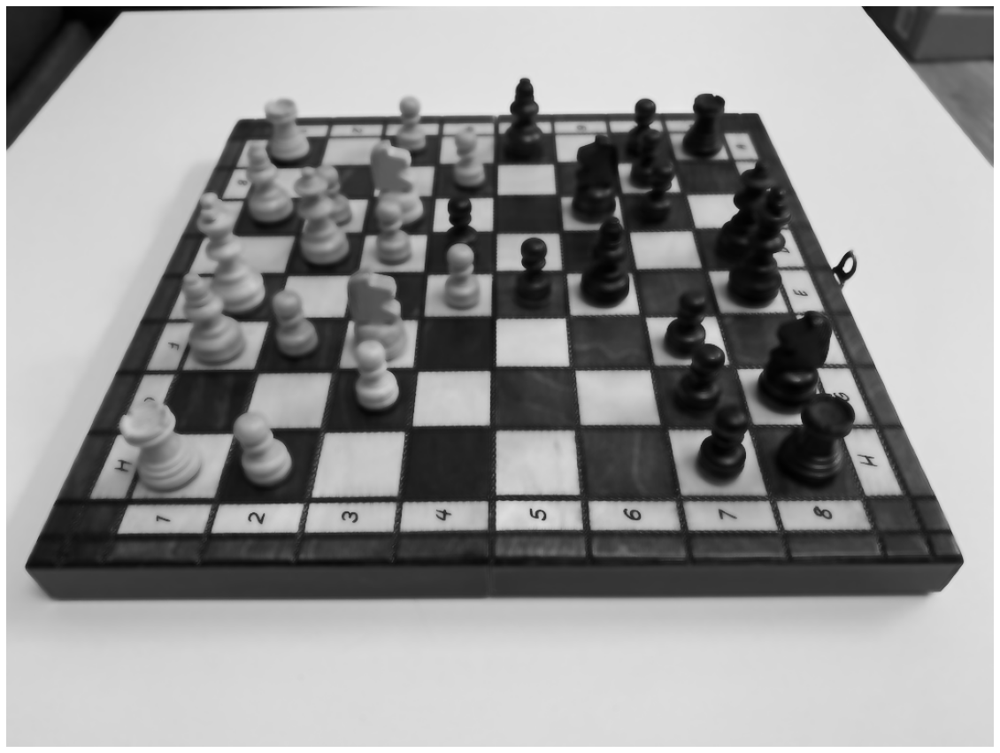

In [108]:
# smooth with bilateral filter

img = cv.bilateralFilter(img, 9, 90, 75)
show_image(img)


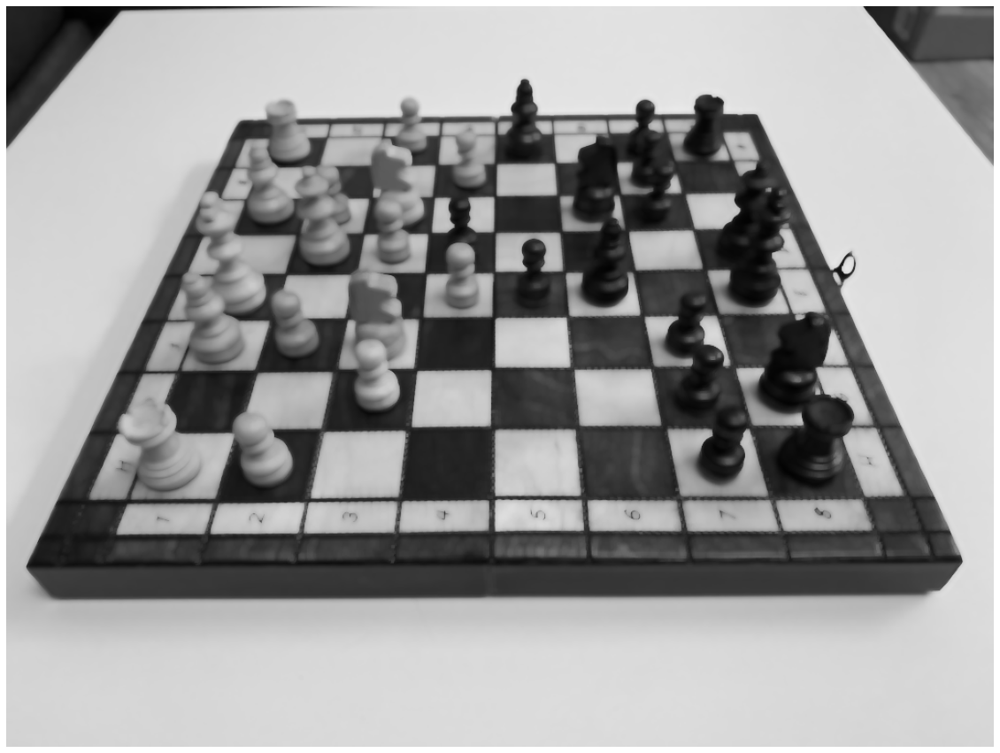

In [109]:
# dilate

img = cv.dilate(img, None, iterations=1)
show_image(img)

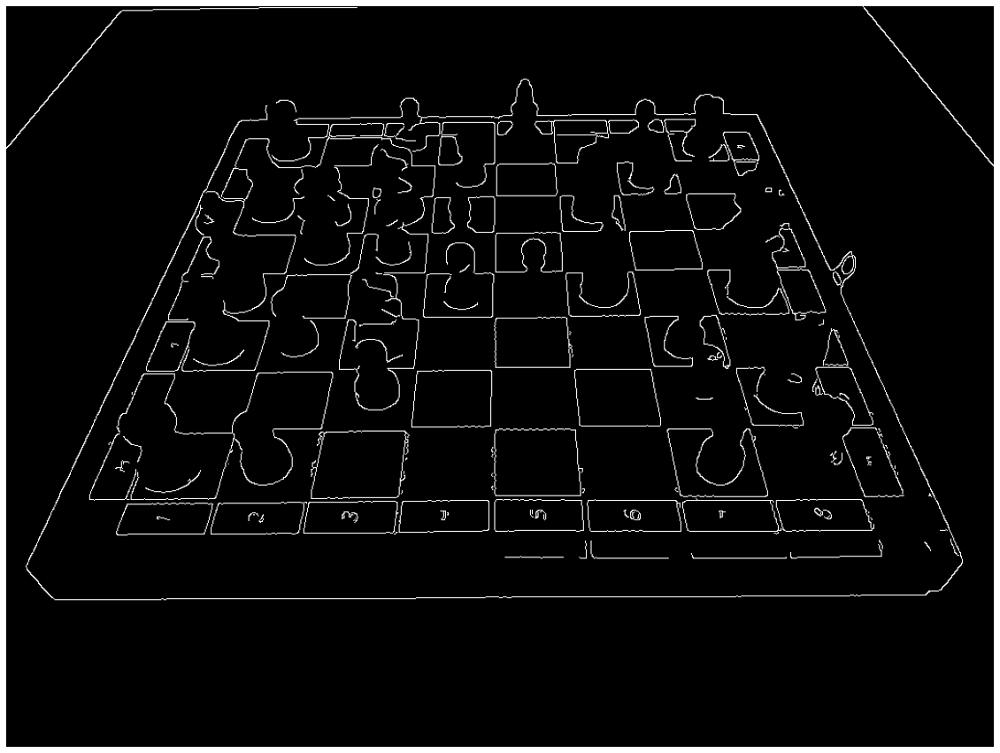

In [110]:
# Canny edge detection

edges = cv.Canny(img, 100, 200)
show_image(edges)

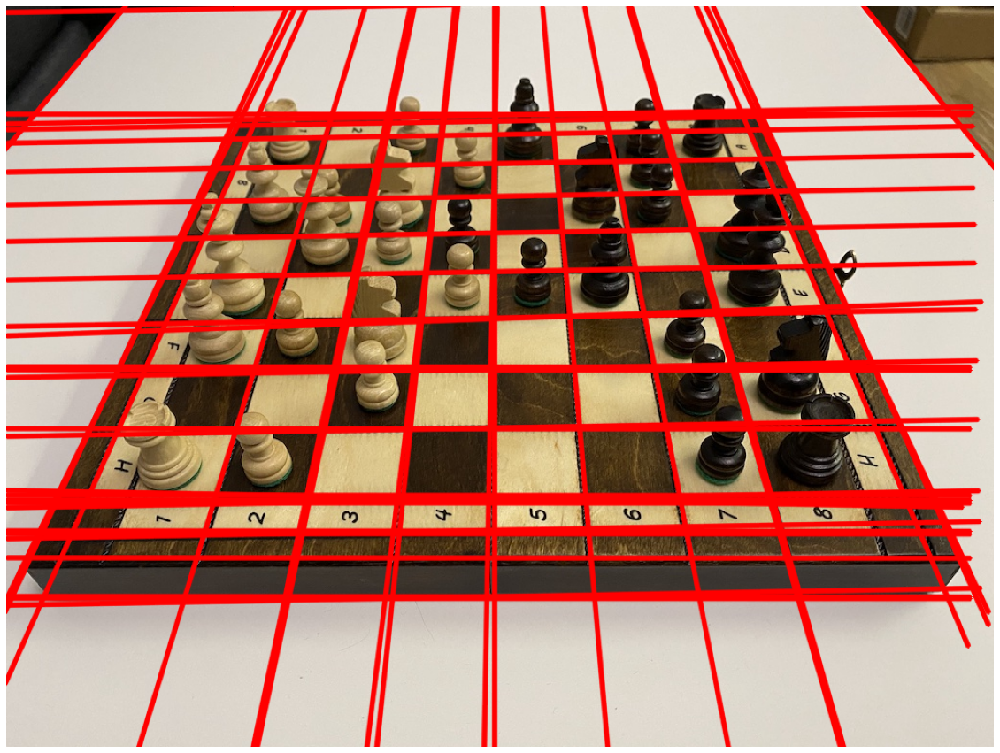

In [111]:
# Hough lines

hough_threshold = 120

hough_lines = process_hough_lines(cv.HoughLines(edges, 1, np.pi / 180, hough_threshold, None, 0, 0))

show_lines(hough_lines, original_img, COLOR_RED)

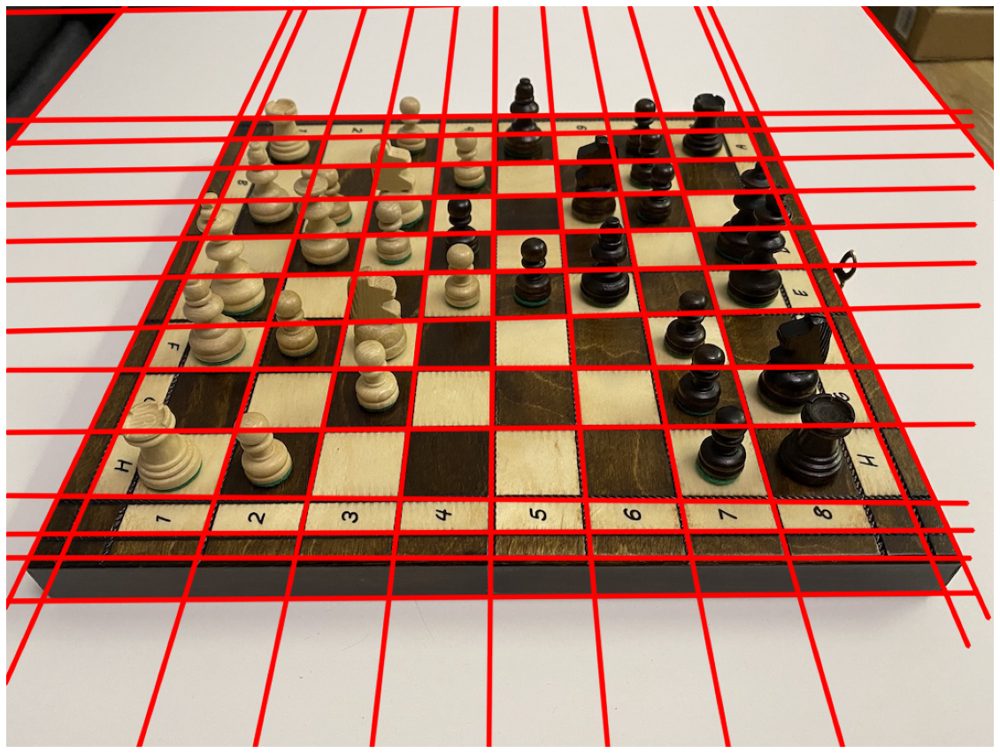

In [112]:
# merge similar lines

merged_lines = merge_lines(hough_lines, rho_threshold=15, theta_threshold=np.pi / 90)

show_lines(merged_lines, original_img, COLOR_RED)

1.5707963267948966

1.5594984580363547

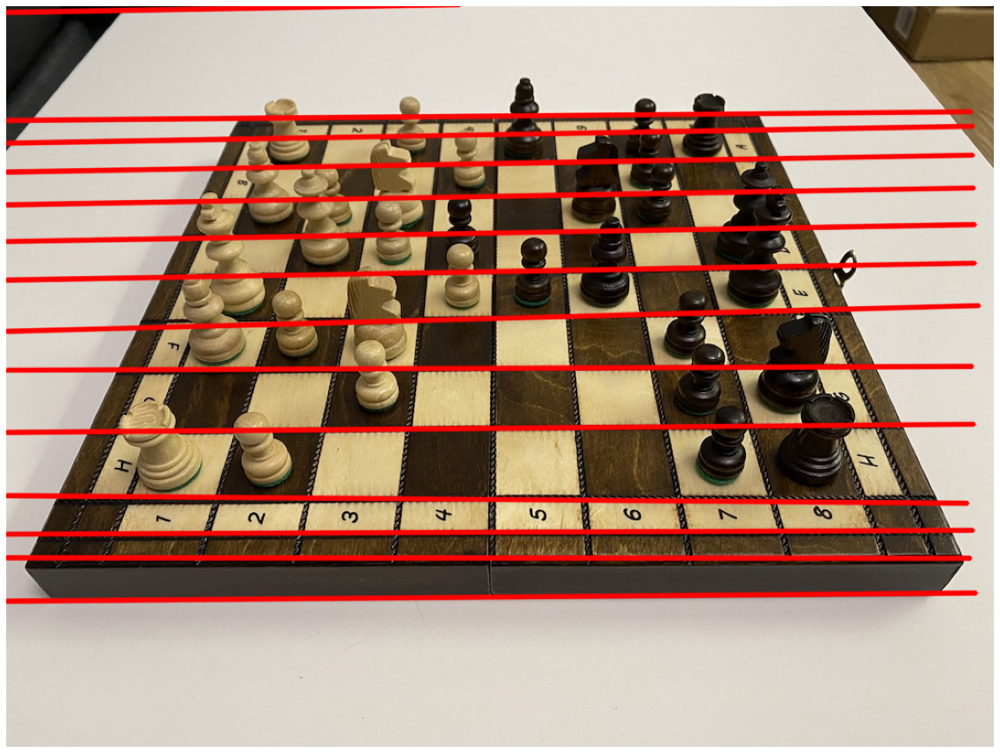

In [113]:
# detect horizontal lines

horizontal_theta_threshold = np.pi / 100
horizontal_lines = list(filter(lambda l: abs(l.theta - HORIZONTAL_THETA) < horizontal_theta_threshold, merged_lines))
show_lines(horizontal_lines, original_img, COLOR_RED)

average = sum(map(lambda l: l.theta, horizontal_lines)) / len(horizontal_lines)
display(HORIZONTAL_THETA)
display(average)


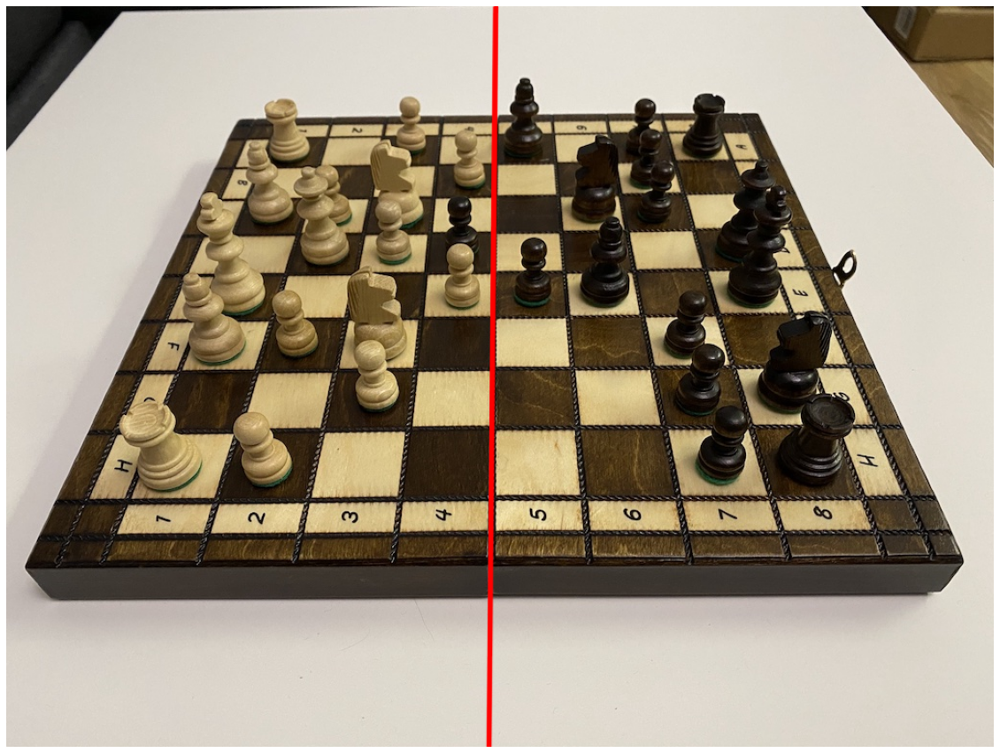

In [114]:
# find central vertical line

# half of the width
central_rho = original_img.shape[1] / 2
central_theta = 0
rho_diff_threshold = original_img.shape[1] * 0.01
theta_diff_threshold = math.pi / 90

central_vertical_line = min(
    map(lambda x: (x[0] + x[1], x[2]),
        filter(lambda x: x[0] < rho_diff_threshold and x[1] < theta_diff_threshold,
            map(lambda l: (abs(central_rho - l.rho), abs(central_theta - l.theta), l), merged_lines)
        )
    )
)[1]

show_lines([central_vertical_line], original_img, COLOR_RED)

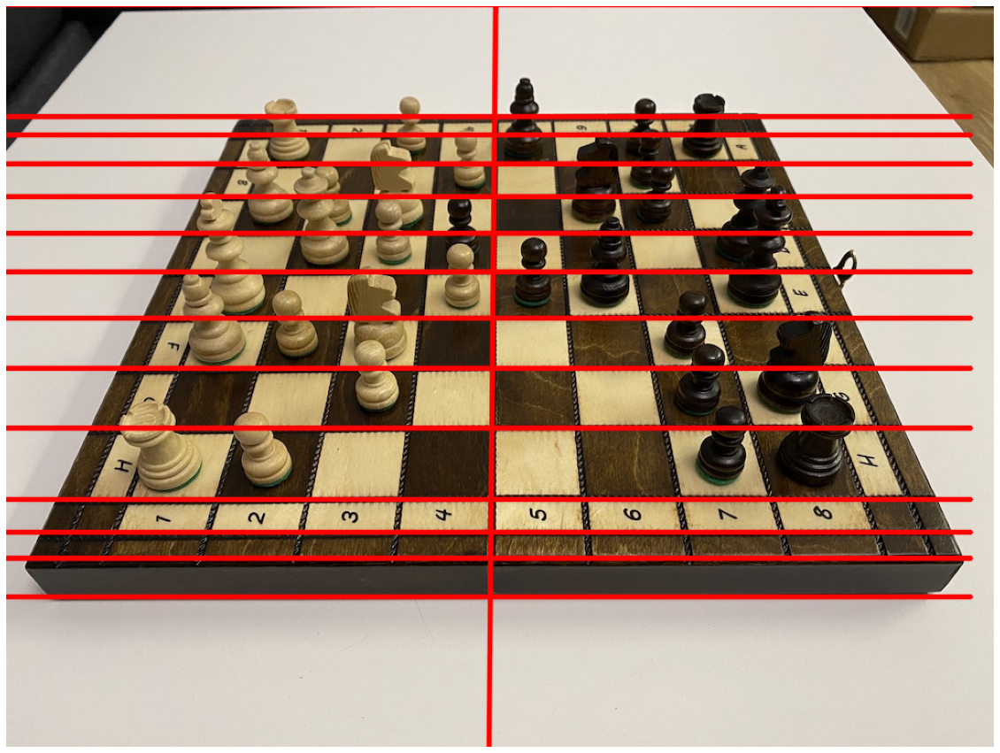

In [115]:
# level horizontal lines

intersection_points = list(map(lambda l: lines_intersection_point(l, central_vertical_line), horizontal_lines))

leveled_horizontal_lines = list(map(lambda p: Line(p[1], HORIZONTAL_THETA), intersection_points))
show_lines(leveled_horizontal_lines + [central_vertical_line], original_img, COLOR_RED)

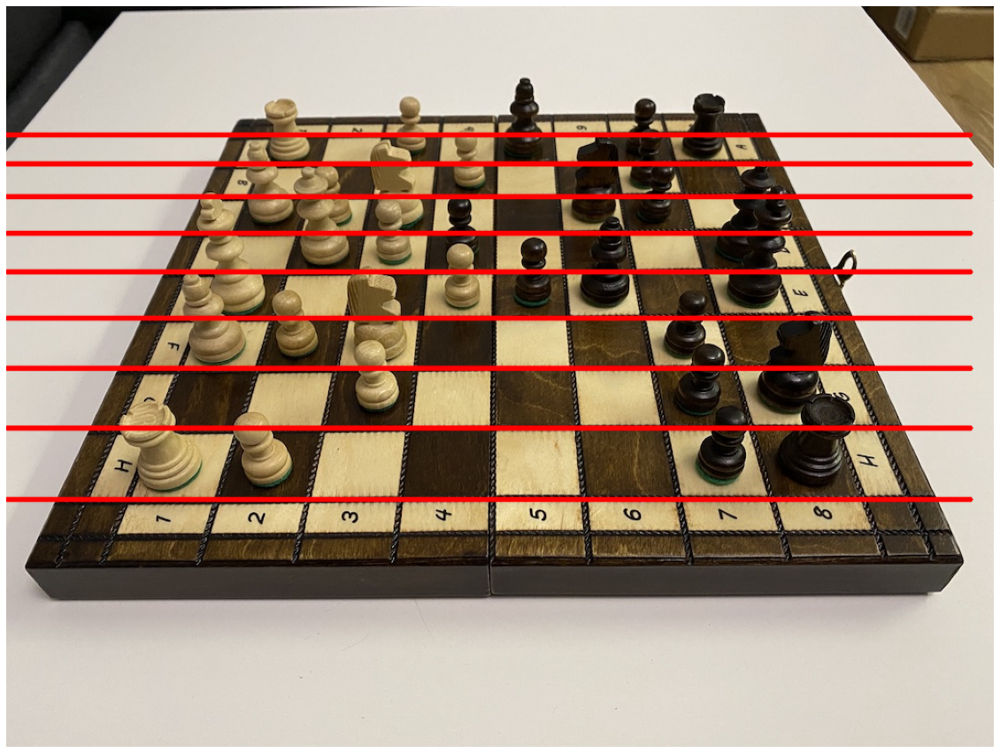

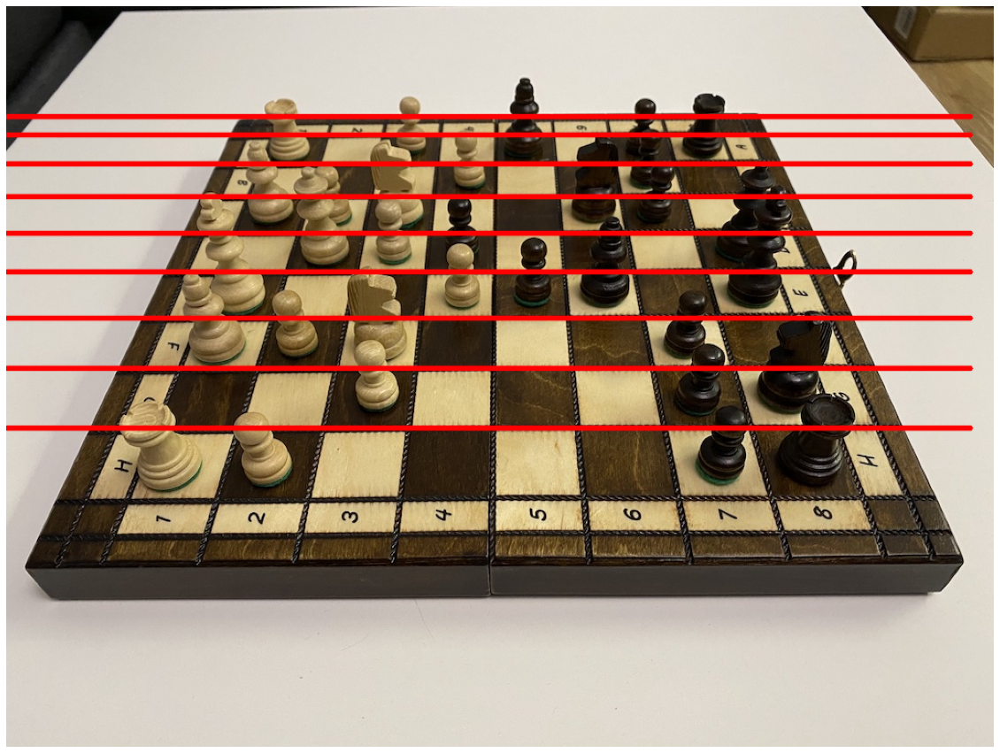

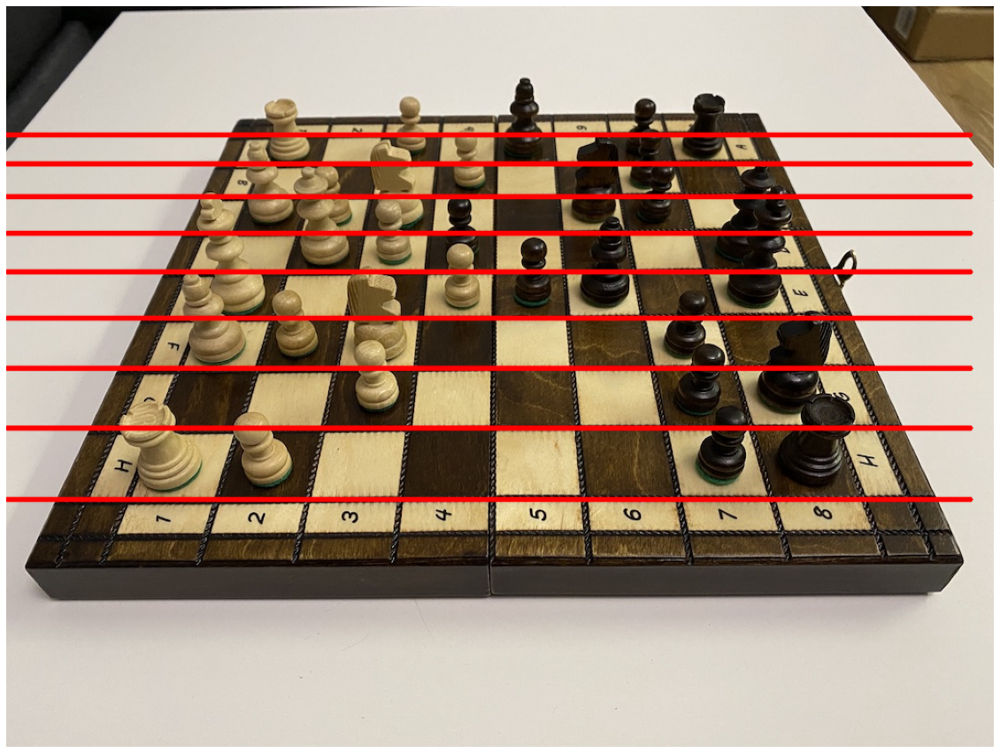

In [116]:
# find chessboard horizontal lines

sorted_horizontal_lines = sorted(leveled_horizontal_lines, key=lambda l: l.rho, reverse=True)

possible_chessboard_horizontal_lines = []
for idx, line in enumerate(sorted_horizontal_lines[:-9]):
    lines = [line, sorted_horizontal_lines[idx + 1]]
    prev_diff = lines[0].rho - lines[1].rho
    for prev_line, curr_line in zip(sorted_horizontal_lines[idx + 1:], sorted_horizontal_lines[idx + 2:]):
        curr_diff = prev_line.rho - curr_line.rho
        if prev_diff > curr_diff:
            lines.append(curr_line)
        else:
            break

        prev_diff = curr_diff

        if len(lines) == CHESSBOARD_LINES_NO:
            possible_chessboard_horizontal_lines.append(lines)
            break


if len(possible_chessboard_horizontal_lines) == 0:
    raise Exception('Failed to find chessboard lines')

for lines in possible_chessboard_horizontal_lines:
    show_lines(lines, original_img, COLOR_RED)

chessboard_horizontal_lines = possible_chessboard_horizontal_lines[0]
if len(possible_chessboard_horizontal_lines) > 1:
    # pick the one in which lines are spread across bigger part of image
    chessboard_horizontal_lines = sorted(
        map(lambda lines: (lines[0].rho - lines[-1].rho, lines), possible_chessboard_horizontal_lines),
        reverse=True
    )[0][1]

show_lines(chessboard_horizontal_lines, original_img, COLOR_RED)